# Sentinel-2 L2A RGB Time Series via Sentinel-Hub Process API

### _Import functional dependencies and add repository source directory to system path_

In [1]:
import os
import yaml
from munch import munchify

In [2]:
# define repo name and get root working directory
repo = 'sentinelhub'
root_path = os.getcwd()[ 0 : os.getcwd().find( repo ) + len ( repo )]
root_path

'C:\\Users\\crwil\\Documents\\GitHub\\sentinelhub'

In [3]:
# add repo source directory to system path
import sys
sys.path.insert(0, os.path.join( root_path, 'src' ) )
sys.path.insert(0, os.path.join( root_path, 'notebooks' ) )

In [4]:
# get path to configuration files
cfg_path = os.path.join( root_path, 'cfg' )
cfg_path = os.path.join( cfg_path, 'sentinel-2' )
cfg_path

'C:\\Users\\crwil\\Documents\\GitHub\\sentinelhub\\cfg\\sentinel-2'

### _Load configuration file from repository cfg sub-directory_ 

In [5]:
# get pathname to configuration file
cfg_file = os.path.join( cfg_path, 's2-timeseries-rgb.yml' )

In [6]:
# print contents of configuration file
with open( cfg_file ) as f:
    print ( f.read() )

request:
    evalscript: |
                //VERSION=3
                function setup() {
                    return {
                      input: [{
                          bands: ["B02", "B03", "B04", "B08"],
                          units: ["reflectance", "reflectance", "reflectance", "reflectance"] 
                      }],
                      output: [{ // this is now an array since there are multiple output objects
                          id: "rgb",
                          bands: 3,
                          sampleType: "FLOAT32"
                      }, {
                          id: "falseColor",
                          bands: 3,
                          sampleType: "FLOAT32"
                      }]
                    }                  
                }
                function evaluatePixel(sample) {
                    return {
                        rgb: [2.5 * sample.B04, 2.5 * sample.B03, 2.5 * sample.B02],
                        falseColor: [2.5 * sam

In [7]:
# load cfg file using yaml parser
with open( cfg_file, 'r' ) as f:
    config = munchify( yaml.safe_load( f ) )

### _Define bounding box collocated with Detroit and Lake St Clair_

In [8]:
# define min and max latlons
coords = -83.039886,42.262866,-82.777136,42.473535
resolution = 20

In [9]:
# create instance of shclient class
from client import ShClient
client = ShClient( config )

In [10]:
# get utm bbox
bbox = client.getBoundingBox( coords )
print ( bbox, bbox.crs.value )

331755.11000511376,4680977.284004892,353915.93938222947,4703884.510632169 32617


In [11]:
# get aoi image dimensions
client.getBoxDimensions( bbox, resolution )

(1108, 1145)

### _Search for S2 scenes with minimal cloud cover between May and mid-July 2020_

In [12]:
# pick a few dates
from datetime import datetime
timeframe = { 'start' : datetime( 2020, 5, 2, 0, 0, 0 ), 
                'end' : datetime( 2020, 7, 15, 23, 59, 59 ) }

In [13]:
# get S2 acquisitions between start / end dates satisfying filter conditions
timestamps = client.getDatasetTimeStamps ( config.request.inputs[ 0 ], bbox, timeframe )
timestamps

C:\Users\crwil\AppData\Roaming\Python\Python39\site-packages\sentinelhub\sh_utils.py:90: SHDeprecationWarning: Parameter base_url is deprecated and will soon be removed. Instead set config.sh_base_url = base_url and provide it with config parameter
  warnings.warn('Parameter base_url is deprecated and will soon be removed. Instead set '


[datetime.datetime(2020, 6, 18, 16, 31, 54, tzinfo=tzutc()),
 datetime.datetime(2020, 7, 3, 16, 31, 36, tzinfo=tzutc()),
 datetime.datetime(2020, 7, 8, 16, 31, 52, tzinfo=tzutc())]

### _Download S2 True Color and False Color Time Series using Process API client_

In [14]:
# get time series
response = client.getTimeSeries ( bbox, timeframe, resolution )
response._df

,rgb.tif,falseColor.tif,time
0,"[[[0.0965, 0.08225, 0.05475], [0.95975, 0.93, ...","[[[0.224, 0.0965, 0.08225], [1.06425, 0.95975,...",2020-06-18 16:31:54+00:00
1,"[[[0.20275, 0.213, 0.1685], [0.743, 0.7085, 0....","[[[0.46075, 0.20275, 0.213], [0.9085, 0.743, 0...",2020-07-03 16:31:36+00:00
2,"[[[0.18925, 0.185, 0.16475], [0.87875, 0.8235,...","[[[0.3245, 0.18925, 0.185], [1.059, 0.87875, 0...",2020-07-08 16:31:52+00:00


### _Visualise S2 True Color and False Color time series_

C:\Users\crwil\Documents\GitHub\sentinelhub\src\response.py:201: MatplotlibDeprecationWarning: 
The mpl_toolkits.legacy_colorbar rcparam was deprecated in Matplotlib 3.4 and will be removed two minor releases later.
  plt.rcParams[ 'mpl_toolkits.legacy_colorbar' ] = False
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


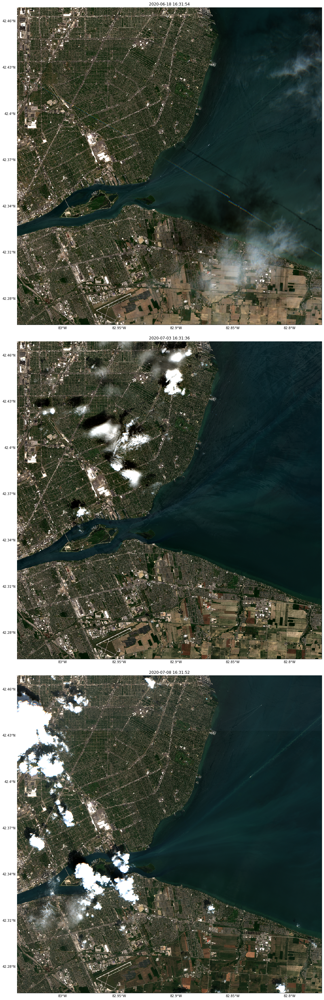

In [15]:
# plot time series
response.plotImages( 'rgb.tif', alpha={ 'data' : 1.0, 'grid' : 0.0 } )

C:\Users\crwil\Documents\GitHub\sentinelhub\src\response.py:201: MatplotlibDeprecationWarning: 
The mpl_toolkits.legacy_colorbar rcparam was deprecated in Matplotlib 3.4 and will be removed two minor releases later.
  plt.rcParams[ 'mpl_toolkits.legacy_colorbar' ] = False
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


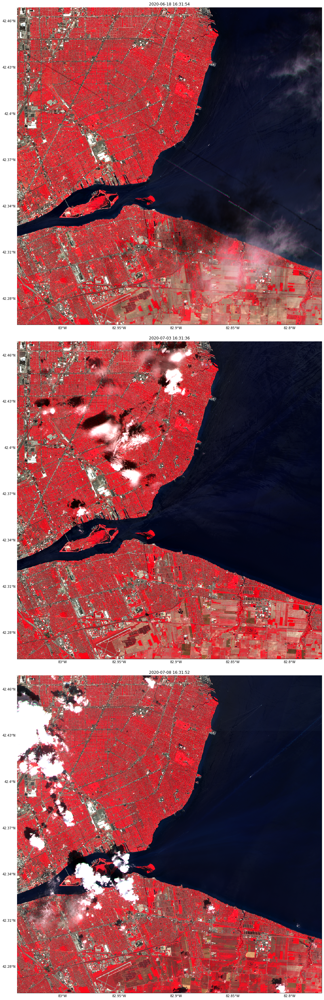

In [16]:
# plot time series
response.plotImages( 'falseColor.tif', alpha={ 'data' : 1.0, 'grid' : 0.0 } )